<a href="https://colab.research.google.com/github/Estiv1719/ER17/blob/main/Titanic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
titanic_df = pd.read_csv("/content/drive/MyDrive/Taller 2/titanic_data.csv")
titanic_df.describe()



,Pclass,Age,SibSp,Parch,Fare,Survived
count,1309.000000,1046.000000,1309.000000,1309.000000,1308.000000,1309.000000
mean,2.294882,29.897706,0.498854,0.385027,33.296261,0.381971
std,0.837836,14.414973,1.041658,0.865560,51.758691,0.486055
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,21.000000,0.000000,0.000000,7.900000,0.000000
50%,3.000000,28.000000,0.000000,0.000000,14.450000,0.000000
75%,3.000000,39.000000,1.000000,0.000000,31.280000,1.000000
max,3.000000,80.000000,8.000000,9.000000,512.330000,1.000000


In [ ]:
pip install ydata-profiling


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 70.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=7808c087ea399fd20f4741bd61619d5cedbc0d0011c7acfb784b3bd5f0ddbf32
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
!pip install ydata-profiling

In [ ]:
import ydata_profiling
# Search for overall trends in the dataset
ydata_profiling.ProfileReport(titanic_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:

# La edad está sesgada y tiene una cantidad significativa de valores faltantes, por lo que es mejor reemplazar los valores faltantes con la mediana de los datos.


age_median = titanic_df['Age'].median(skipna=True)
titanic_df['Age'].fillna(age_median, inplace=True)


In [ ]:
# A la cabina le faltan demasiados valores y se eliminará por completo del marco de datos


titanic_df.drop('Cabin', axis=1, inplace=True)

In [ ]:
# A Embarked solo le faltan 2 valores y se puede reemplazar con el más común que es S

titanic_df['Embarked'].fillna("S", inplace=True)

In [ ]:
# A la tarifa le falta un valor y se puede reemplazar con la mediana porque está muy sesgada

fare_median = titanic_df['Fare'].median(skipna=True)
titanic_df['Fare'].fillna(fare_median,inplace=True)

In [ ]:
#SibSp - Número de hermanas / cónyuges a bordo
#Parch - Número de padres/hijos a bordo
# Estas dos variables se superponen para cada pasajero que tiene estos datos, por lo que estoy creando una variable que simplemente detecta
# si alguien viaja solo o no para tener en cuenta la multicolinealidad

titanic_df['TravelGroup']=titanic_df["SibSp"]+titanic_df["Parch"]
titanic_df['TravelAlone']=np.where(titanic_df['TravelGroup']>0, 0, 1)
titanic_df.head()



,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,Survived,TravelGroup,TravelAlone
0,1,"Allen, Miss. Elisabeth Walton",female,29.0,0,0,24160,211.34,S,1,0,1
1,1,"Allison, Master. Hudson Trevor",male,1.0,1,2,113781,151.55,S,1,3,0
2,1,"Allison, Miss. Helen Loraine",female,2.0,1,2,113781,151.55,S,0,3,0
3,1,"Allison, Mr. Hudson Joshua Creighton",male,30.0,1,2,113781,151.55,S,0,3,0
4,1,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0,1,2,113781,151.55,S,0,3,0


In [ ]:
titanic_df['TravelTotal'] = titanic_df['TravelGroup'] + 1

In [ ]:
titanic_df.drop('SibSp', axis=1, inplace=True)
titanic_df.drop('Parch', axis=1, inplace=True)
titanic_df.drop('TravelGroup', axis=1, inplace=True)
titanic_df.drop('Ticket', axis=1, inplace=True)
titanic_df.drop('Name', axis=1, inplace=True)

In [ ]:
pip install scikit-learn

In [ ]:

from sklearn import preprocessing  # Asegúrate de importar preprocessing



# Hot Encode PClass, Sexo, Embarcado
le = preprocessing.LabelEncoder()
pclass_cat = le.fit_transform(titanic_df.Pclass)
sex_cat = le.fit_transform(titanic_df.Sex)
embarked_cat = le.fit_transform(titanic_df.Embarked)

# Inicializar las columnas categóricas codificadas
titanic_df['pclass_cat'] = pclass_cat
titanic_df['sex_cat'] = sex_cat
titanic_df['embarked_cat'] = embarked_cat

In [ ]:
# Elimine los campos categóricos antiguos del marco de datos y vuelva a indexarlos

dummy_fields = ['Pclass','Sex','Embarked']
data = titanic_df.drop(dummy_fields, axis = 1)
data = titanic_df.reindex(['pclass_cat','sex_cat','Age','Fare','embarked_cat','TravelAlone', 'TravelTotal','Survived'],axis=1)

In [ ]:
data

,pclass_cat,sex_cat,Age,Fare,embarked_cat,TravelAlone,TravelTotal,Survived
0,0,0,29.0,211.34,2,1,1,1
1,0,1,1.0,151.55,2,0,4,1
2,0,0,2.0,151.55,2,0,4,0
3,0,1,30.0,151.55,2,0,4,0
4,0,0,25.0,151.55,2,0,4,0
...,...,...,...,...,...,...,...,...
1304,2,0,15.0,14.45,0,0,2,0
1305,2,0,28.0,14.45,0,0,2,0
1306,2,1,27.0,7.23,0,1,1,0
1307,2,1,27.0,7.23,0,1,1,0


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Normalizar las variables continuas.

continuous = ['Age', 'Fare', 'TravelTotal']

scaler = StandardScaler()

for var in continuous:
    data[var] = data[var].astype('float64')
    data[var] = scaler.fit_transform(data[var].values.reshape(-1, 1))

In [ ]:
data

,pclass_cat,sex_cat,Age,Fare,embarked_cat,TravelAlone,TravelTotal,Survived
0,0,0,-0.040027,3.442616,2,1,-0.558346,1
1,0,1,-2.210230,2.286623,2,0,1.336749,1
2,0,0,-2.132722,2.286623,2,0,1.336749,0
3,0,1,0.037481,2.286623,2,0,1.336749,0
4,0,0,-0.350056,2.286623,2,0,1.336749,0
...,...,...,...,...,...,...,...,...
1304,2,0,-1.125128,-0.364099,0,0,0.073352,0
1305,2,0,-0.117534,-0.364099,0,0,0.073352,0
1306,2,1,-0.195041,-0.503693,0,1,-0.558346,0
1307,2,1,-0.195041,-0.503693,0,1,-0.558346,0


In [ ]:
# Asegúrese de que los datos estén limpios/verifique si son nulos
data[data.isnull().any(axis=1)].head()

,pclass_cat,sex_cat,Age,Fare,embarked_cat,TravelAlone,TravelTotal,Survived


In [ ]:
# Dividir entradas y salidas
X = data.iloc[:, 0:7]
Y = data.iloc[:, 7]

In [ ]:
from sklearn.model_selection import train_test_split
# División de prueba/entrenamiento
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
#NB - All columns
#Initialize + fit model
gnb = GaussianNB().fit(X_train, y_train)

In [ ]:
#Predictions
y_pred = gnb.predict(X_test)

#Accuracy Score
NB_all_accuracy = accuracy_score(y_test,y_pred)
print('Naive Bayes Model Accuracy with all attributes: {0:.2f}'.format(NB_all_accuracy))

Naive Bayes Model Accuracy with all attributes: 0.74


### Decision Tree  

In [ ]:
from sklearn.tree import DecisionTreeClassifier

#DT1 - All attributes
#Initalize + fit model

tree = DecisionTreeClassifier(criterion = 'entropy', min_samples_split = 2,
random_state=5).fit(X_train, y_train)

#Predictions
y_pred = tree.predict(X_test)

#Accuracy Score
tree_all_accuracy = accuracy_score(y_test, y_pred)
print('Decision Tree Accuracy with all attributes: {0:.2f}'.format(tree_all_accuracy))

Decision Tree Accuracy with all attributes: 0.75


In [ ]:

#Tree visualization function
def visualize_tree(tree_data, names):
    dot_data = StringIO()
    export_graphviz(tree_data,out_file=dot_data,
                         feature_names=names,
                         filled=True,rounded=True,
                         special_characters=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return Image(graph.create_png())

In [ ]:
pip install pydotplus

In [ ]:
pip install graphviz

In [ ]:
from sklearn.tree import export_graphviz
from io import StringIO
import pydotplus
from PIL import Image
from IPython.display import Image

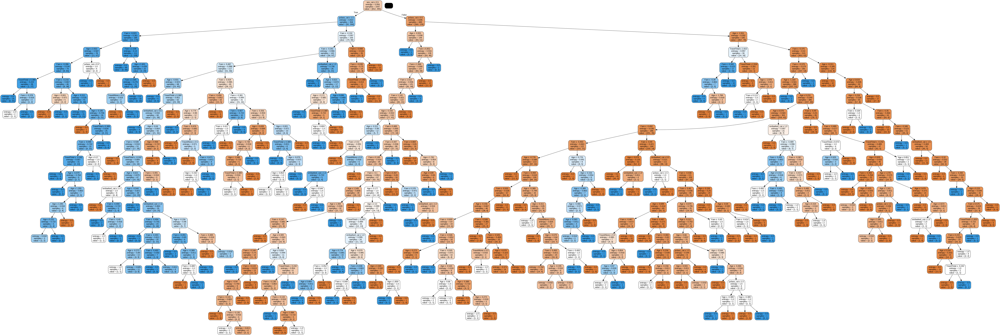

In [ ]:
names = ['pclass_cat','sex_cat','Age','Fare','embarked_cat','TravelAlone','TravelTotal' ]
visualize_tree(tree,names)

In [ ]:
print(tree.feature_importances_)

[0.09619164 0.25148002 0.26601314 0.29327524 0.0306042  0.00978602
 0.05264975]


In [ ]:
high_importance = ['sex_cat','Age','Fare']
X_train2 = X_train[high_importance]
X_test2 = X_test[high_importance]

In [ ]:
#DT2 - Top 3 features only
#Initialize + fit model
tree2 = DecisionTreeClassifier(criterion = 'gini', min_samples_split = 2, random_state=5).fit(X_train2, y_train)

In [ ]:
#Predictions
y_pred2 = tree2.predict(X_test2)

#Accuracy Score
tree_imp_accuracy = accuracy_score(y_test, y_pred2)

In [ ]:
print('Decision Tree Accuracy with high importance attributes: {0:.2f}'.format(tree_imp_accuracy))

Decision Tree Accuracy with high importance attributes: 0.74


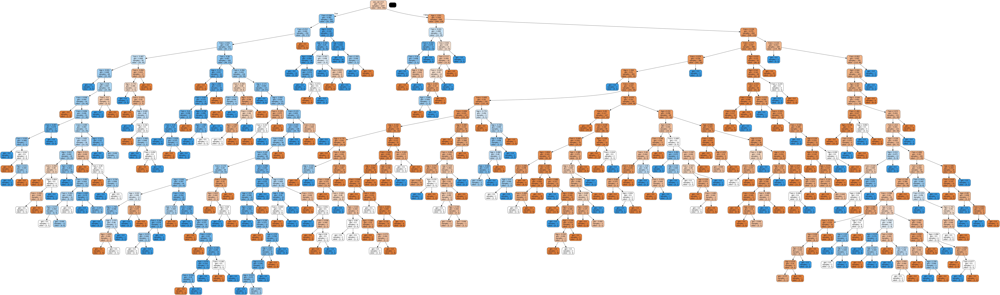

In [ ]:
#DT2 Graph
visualize_tree(tree2,high_importance)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RF1 - All attributes
#Initalize + fit model
clf = RandomForestClassifier(n_jobs=2, random_state=0).fit(X_train, y_train)

In [ ]:
#Predictions
y_pred = clf.predict(X_test)

In [ ]:
#Accuracy Score
RF_all_accuracy = accuracy_score(y_test,y_pred)
print('Random Forest Accuracy with all attributes: {0:.2f}'.format(RF_all_accuracy))

Random Forest Accuracy with all attributes: 0.79


In [ ]:
print(clf.feature_importances_)

[0.06784096 0.27632021 0.27235617 0.28056072 0.03209589 0.01075858
 0.06006746]


In [ ]:
#RF2 - Top 3 features only
#Initialize + fit model
clf2 = RandomForestClassifier(n_jobs=2, random_state=0).fit(X_train2, y_train)

In [ ]:
#Predictions
y_pred2 = clf2.predict(X_test2)

In [ ]:
#Accuracy Score
RF_imp_accuracy = accuracy_score(y_test,y_pred2)
print('Random Forest Accuracy with high importance attributes: {0:.2f}'.format(RF_imp_accuracy))

Random Forest Accuracy with high importance attributes: 0.79


### Neural Network

In [ ]:
def create_model(lyrs=[8], act='linear', opt='Adam', dr=0.0):
  # set random seed for reproducibility
  seed(42)

In [ ]:
!pip install tensorflow

In [ ]:
def create_model(lyrs=[8], act='linear', opt='Adam', dr=0.0):
  # set random seed for reproducibility
  seed(42)

  model = Sequential()
  # create first hidden layer
  model.add(Dense(lyrs[0], input_dim=X_train.shape[1], activation=act))

  # create additional hidden layers
  for i in range(1,len(lyrs)):
    model.add(Dense(lyrs[i], activation=act))

  # add dropout, default is none
  model.add(Dropout(dr))
  # create output layer
  model.add(Dense(1, activation='sigmoid'))
  # output layer
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

In [ ]:
!pip install tensorflow

In [ ]:
from numpy.random import seed
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

#Initialize and create model
model = create_model()
print(model.summary())

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 8)                   │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 8)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 73 (292.00 B)

 Trainable params: 73 (292.00 B)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
#Train neural
nn = model.fit(X_train, y_train, epochs=100, validation_split = 0.2, batch_size=32, verbose=0)
nn_accuracy = np.mean(nn.history['val_accuracy'])
print('Neural Network Accuracy: {0:.2f}'.format(nn_accuracy))

Neural Network Accuracy: 0.83


In [ ]:
!apt install python3-gi python3-gi-cairo gir1.2-gtk-3.0

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
python3-gi is already the newest version (3.42.1-0ubuntu1).
python3-gi set to manually installed.
The following additional packages will be installed:
  gir1.2-atk-1.0 gir1.2-freedesktop gir1.2-gdkpixbuf-2.0 gir1.2-harfbuzz-0.0 gir1.2-pango-1.0
  libpangoxft-1.0-0 python3-cairo
The following NEW packages will be installed:
  gir1.2-atk-1.0 gir1.2-freedesktop gir1.2-gdkpixbuf-2.0 gir1.2-gtk-3.0 gir1.2-harfbuzz-0.0
  gir1.2-pango-1.0 libpangoxft-1.0-0 python3-cairo python3-gi-cairo
0 upgraded, 9 newly installed, 0 to remove and 49 not upgraded.
Need to get 482 kB of archives.
After this operation, 2,131 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 gir1.2-atk-1.0 amd64 2.36.0-3build1 [21.0 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 gir1.2-freedesktop amd64 1.72.0-1 [22.3 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy-updat

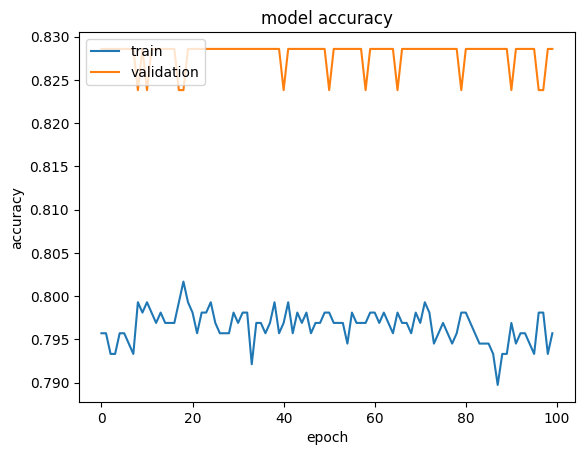

In [ ]:
import matplotlib
#matplotlib.use('GTK3Agg')
#matplotlib.use('TKAgg')
#matplotlib.use('Qt5Agg')

# Otra opción podría ser 'Qt5Agg' o 'GTK3Agg'
import matplotlib.pyplot as plt
#Summarize history of accuracy
plt.plot(nn.history['accuracy'])
plt.plot(nn.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

plt.savefig('my_plot.png')  # Save the plot to a file instead of showing it
plt.show()

In [ ]:
#All Accuracies
print('NB accuracy: {0:.2f}'.format(NB_all_accuracy))
print("Decision Tree:")
print('All attributes: {0:.2f}'.format(tree_all_accuracy))
print('High importance attributes: {0:.2f}'.format(tree_imp_accuracy))
print("Random Forest:")
print('All attributes: {0:.2f}'.format(RF_all_accuracy))
print('High importance attributes: {0:.2f}'.format(RF_imp_accuracy))
print("Neural Network: ")
print('All attributes: {0:.2f}'.format(nn_accuracy))

NB accuracy: 0.74
Decision Tree:
All attributes: 0.75
High importance attributes: 0.74
Random Forest:
All attributes: 0.79
High importance attributes: 0.79
Neural Network: 
All attributes: 0.83


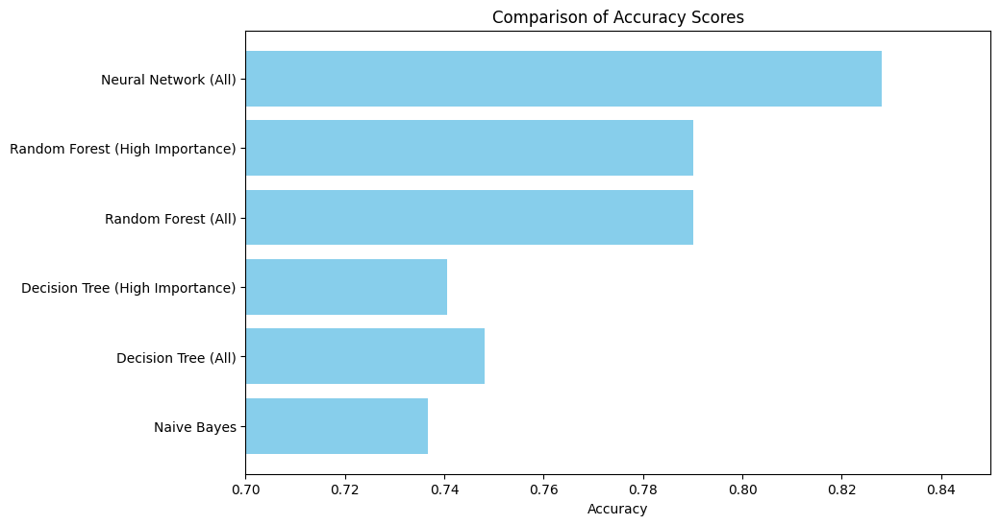

In [ ]:
import matplotlib.pyplot as plt
# Definir los métodos y sus tasas de precisión
methods = ['Naive Bayes', 'Decision Tree (All)', 'Decision Tree (High Importance)', 'Random Forest (All)',
           'Random Forest (High Importance)', 'Neural Network (All)']
accuracies = [NB_all_accuracy, tree_all_accuracy, tree_imp_accuracy, RF_all_accuracy, RF_imp_accuracy, nn_accuracy]
# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
plt.barh(methods, accuracies, color='skyblue')
plt.xlabel('Accuracy')
plt.title('Comparison of Accuracy Scores')
plt.xlim(0.7, 0.85) # Establecer el límite del eje x para una mejor visualización
plt.show()

In [ ]:
import pandas as pd
# Crear un DataFrame con los métodos y sus tasas de precisión
data = { 'Method': ['Naive Bayes', 'Decision Tree (All)', 'Decision Tree (High Importance)', 'Random Forest (All)', 'Random Forest (High Importance)', 'Neural Network (All)'], 'Accuracy': [NB_all_accuracy, tree_all_accuracy, tree_imp_accuracy, RF_all_accuracy, RF_imp_accuracy, nn_accuracy] }
df = pd.DataFrame(data)
# Imprimir la tabla print(df)
print(df)

                            Method  Accuracy
0                      Naive Bayes  0.736641
1              Decision Tree (All)  0.748092
2  Decision Tree (High Importance)  0.740458
3              Random Forest (All)  0.790076
4  Random Forest (High Importance)  0.790076
5             Neural Network (All)  0.828000
